In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv(r'D:/UMassD Files/MTH 522/Project 2\data-police-shootings-master/v1/fatal-police-shootings-data.csv')
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [3]:
df['race'].value_counts()

race
W    3300
B    1766
H    1166
A     129
N     105
O      19
Name: count, dtype: int64

In [4]:
df.shape

(8002, 17)

In [5]:
df2 = pd.read_csv(r'D:/UMassD Files/MTH 522/Project 2\data-police-shootings-master/v2/fatal-police-shootings-agencies.csv')
df2.head()

,id,name,type,state,oricodes,total_shootings
0,3145,Abbeville County Sheriff's Office,sheriff,SC,SC00100,1
1,2576,Aberdeen Police Department,local_police,WA,WA01401,1
2,2114,Abilene Police Department,local_police,TX,TX22101,3
3,2088,Abington Township Police Department,local_police,PA,PA04601,1
4,3187,Acadia Parish Sheriff's Office,sheriff,LA,LA00100,1


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8002 entries, 0 to 8001
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       8002 non-null   int64  
 1   name                     7548 non-null   object 
 2   date                     8002 non-null   object 
 3   manner_of_death          8002 non-null   object 
 4   armed                    7791 non-null   object 
 5   age                      7499 non-null   float64
 6   gender                   7971 non-null   object 
 7   race                     6485 non-null   object 
 8   city                     8002 non-null   object 
 9   state                    8002 non-null   object 
 10  signs_of_mental_illness  8002 non-null   bool   
 11  threat_level             8002 non-null   object 
 12  flee                     7036 non-null   object 
 13  body_camera              8002 non-null   bool   
 14  longitude               

In [7]:
df_bw = df.loc[(df["race"] =='W')|(df["race"] == 'B')]
df_bw.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
5,11,Kenneth Joe Brown,2015-01-04,shot,gun,18.0,M,W,Guthrie,OK,False,attack,Not fleeing,False,-97.423,35.877,True
7,15,Brock Nichols,2015-01-06,shot,gun,35.0,M,W,Assaria,KS,False,attack,Not fleeing,False,-97.564,38.704,True
8,16,Autumn Steele,2015-01-06,shot,unarmed,34.0,F,W,Burlington,IA,False,other,Not fleeing,True,-91.119,40.809,True


In [8]:
arr_b = np.array(df_bw.loc[df_bw["race"]=='B']["age"])
arr_w = np.array(df_bw.loc[df_bw["race"]=='W']["age"])
print(len(arr_b),len(arr_w))

1766 3300


In [9]:
arr_b = arr_b[~np.isnan(arr_b)]
arr_w = arr_w[~np.isnan(arr_w)]

c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

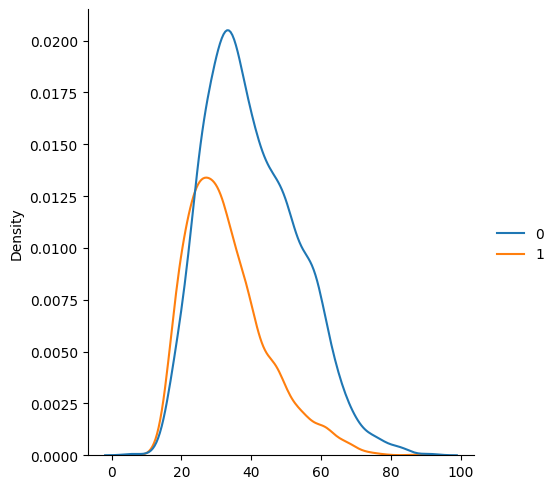

In [10]:
sns.displot(data=[arr_w,arr_b], kind = "kde", legend=True)

In [11]:
df['flee'].value_counts()

flee
Not fleeing    4430
Car            1289
Foot           1022
Other           295
Name: count, dtype: int64

In [12]:
arr_nf = np.array(df_bw.loc[df_bw["flee"]=='Not fleeing']["age"])
arr_f = np.array(df_bw.loc[df_bw["flee"]!='Not fleeing']["age"])
print(len(arr_nf),len(arr_f))

2946 2120


In [13]:
df['race'].value_counts()

race
W    3300
B    1766
H    1166
A     129
N     105
O      19
Name: count, dtype: int64

In [14]:
raceshare = pd.read_csv(r'D:/UMassD Files/MTH 522/Project 2/ShareRaceByCity.csv')
raceshare.head()


,Geographic area,City,share_white,share_black,share_native_american,share_asian,share_hispanic
0,AL,Abanda CDP,67.2,30.2,0,0,1.6
1,AL,Abbeville city,54.4,41.4,0.1,1,3.1
2,AL,Adamsville city,52.3,44.9,0.5,0.3,2.3
3,AL,Addison town,99.1,0.1,0,0.1,0.4
4,AL,Akron town,13.2,86.5,0,0,0.3


In [15]:
race = raceshare
race["City"].replace(["city", "CDP", "town"], "", regex=True, inplace=True) 
race.rename(columns={'Geographic area':'state'})
race.head()


,Geographic area,City,share_white,share_black,share_native_american,share_asian,share_hispanic
0,AL,Abanda,67.2,30.2,0,0,1.6
1,AL,Abbeville,54.4,41.4,0.1,1,3.1
2,AL,Adamsville,52.3,44.9,0.5,0.3,2.3
3,AL,Addison,99.1,0.1,0,0.1,0.4
4,AL,Akron,13.2,86.5,0,0,0.3


In [16]:
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [17]:
races = ["A", "W", "H", "B", "N", "O"]
killed_per_race = []

for i in races:
    i_kills = df['race'].loc[df['race']==i].count()
    killed_per_race.append(i_kills)

print(killed_per_race)

[129, 3300, 1166, 1766, 105, 19]


In [18]:
#Calculating the proportion of kills per race. Population values collected from data.census.gov
proportion_deaths_by_race = []
for i in races:
    
    if i == "A":
        j = killed_per_race[0]/19886049.0
        print(f'Percentage of Asians killed is: {j}')
    elif i == "W":
        j = killed_per_race[1]/204277273.0
        print(f'Percentage of Whites killed is: {j}')
    elif i == "H":
        j = killed_per_race[2]/62080044.0
        print(f'Percentage of Hispanics killed is: {j}')
    elif i == "B":
        j = killed_per_race[3]/41104200.0
        print(f'Percentage of Blacks killed is: {j}')
    elif i == "N":
        j = killed_per_race[4]/(3727135.0+689966.0)
        print(f'Percentage of Native Americans killed is: {j}')
    else:
        j = killed_per_race[5]/27915715.0
        print(f'Percentage of Other races killed is: {j}')
        
    proportion_deaths_by_race.append(j)

Percentage of Asians killed is: 6.486959777681328e-06
Percentage of Whites killed is: 1.615451367416678e-05
Percentage of Hispanics killed is: 1.8782203182716817e-05
Percentage of Blacks killed is: 4.296397935004209e-05
Percentage of Native Americans killed is: 2.3771247250176076e-05
Percentage of Other races killed is: 6.806202169638141e-07


c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and

<Axes: title={'center': 'People killed as a proportion of their respective race'}>

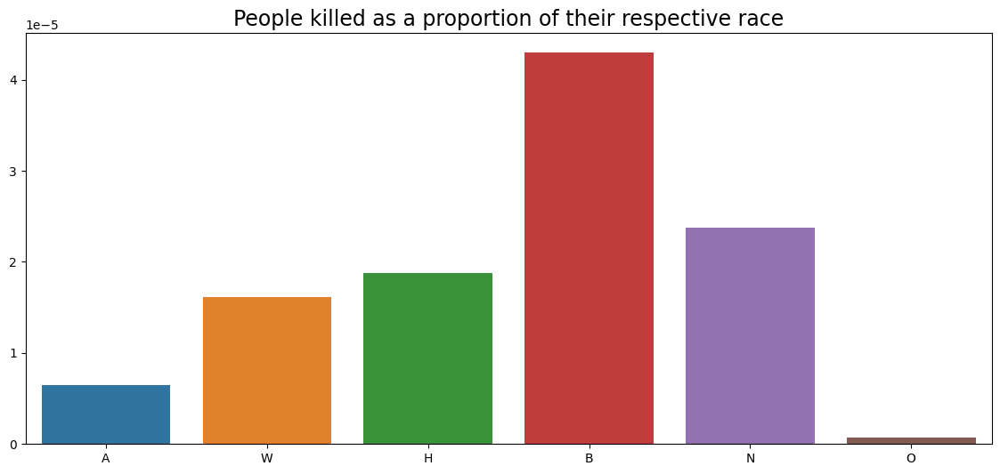

In [19]:
plt.figure(figsize=(14,6))
plt.title("People killed as a proportion of their respective race", fontsize=17)
sns.barplot(x=races, y=proportion_deaths_by_race)

In [20]:
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [21]:
df['manner_of_death'].value_counts()

manner_of_death
shot                7664
shot and Tasered     338
Name: count, dtype: int64

c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


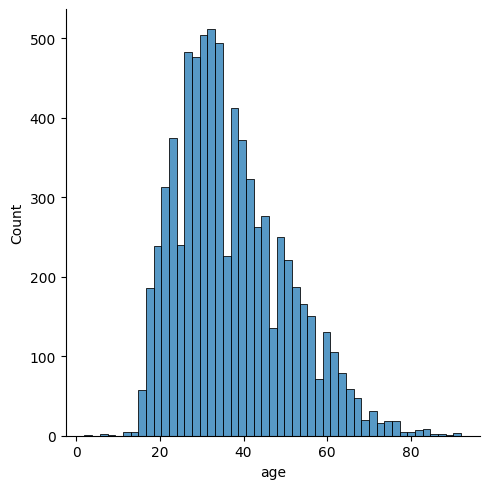

In [22]:
sns.displot(data=df['age'], kind = "hist")

c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:848: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is de

Text(0.5, 1.0, 'Age distribution, by race')

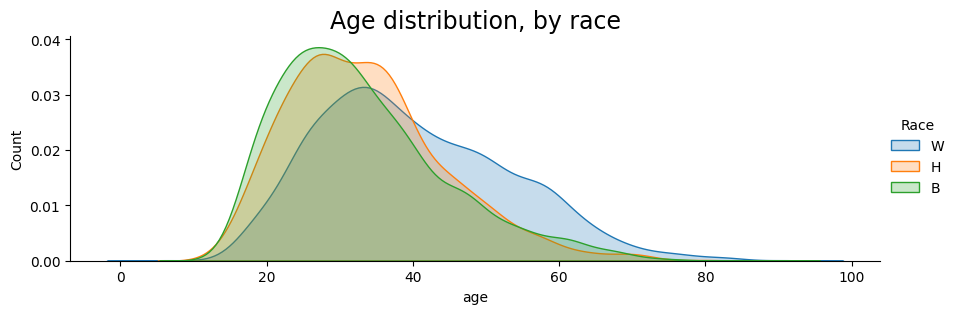

In [23]:
# First, create dataset with only Blacks, Whites, Hispanics

three_races = df.loc[(df["race"] == "B") | (df["race"] == "W") | (df["race"] == "H")]

g = sns.FacetGrid(data=three_races, hue="race", aspect=3)
g.map(sns.kdeplot, "age", shade=True)
g.add_legend(title="Race")


g.set_ylabels("Count")
plt.title("Age distribution, by race", fontsize=17)

In [24]:
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


C:\Users\devch\AppData\Local\Temp\ipykernel_7812\1309225924.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_armed['count'] = 1
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\devch\AppData\Local\Programs\Python\Pytho

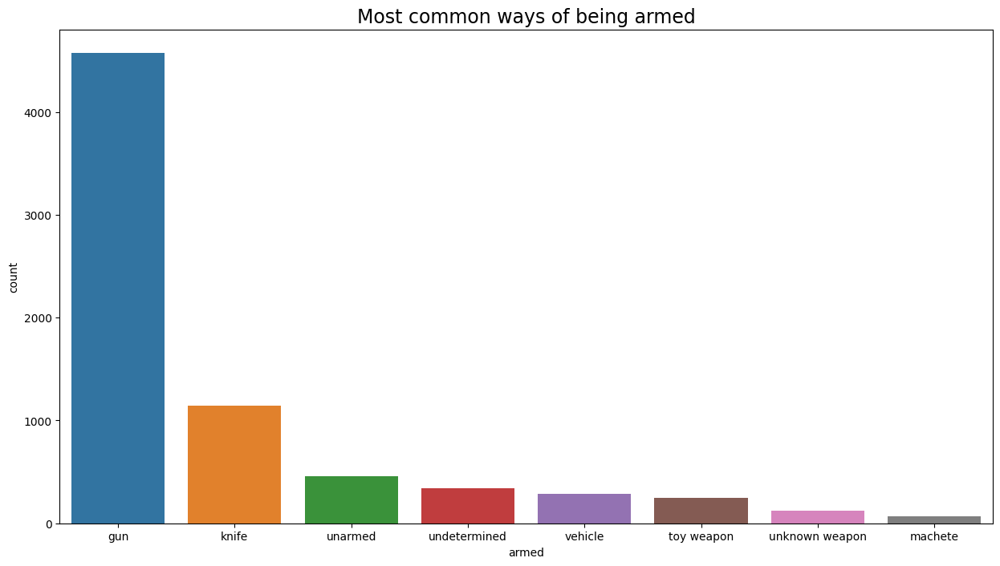

In [25]:
#Most common ways of being armed
armed = df['armed'].value_counts(ascending=False)

df_armed = df[['armed']]
df_armed['count'] = 1

grouped_armed = df_armed.groupby('armed', as_index=False, sort=False).sum()
grouped_armed.sort_index(ascending=False, inplace=True)

grouped_armed = grouped_armed.sort_values(by='count', ascending=False).head(8)

plt.figure(figsize=(15, 8))
sns.barplot(data=grouped_armed, x='armed', y='count')
plt.title("Most common ways of being armed", fontsize=17)
plt.show()

In [26]:
race.head()

,Geographic area,City,share_white,share_black,share_native_american,share_asian,share_hispanic
0,AL,Abanda,67.2,30.2,0,0,1.6
1,AL,Abbeville,54.4,41.4,0.1,1,3.1
2,AL,Adamsville,52.3,44.9,0.5,0.3,2.3
3,AL,Addison,99.1,0.1,0,0.1,0.4
4,AL,Akron,13.2,86.5,0,0,0.3


In [27]:
race["city"] = race["City"] + ", " + race["Geographic area"]
race.head()

,Geographic area,City,share_white,share_black,share_native_american,share_asian,share_hispanic,city
0,AL,Abanda,67.2,30.2,0,0,1.6,"Abanda , AL"
1,AL,Abbeville,54.4,41.4,0.1,1,3.1,"Abbeville , AL"
2,AL,Adamsville,52.3,44.9,0.5,0.3,2.3,"Adamsville , AL"
3,AL,Addison,99.1,0.1,0,0.1,0.4,"Addison , AL"
4,AL,Akron,13.2,86.5,0,0,0.3,"Akron , AL"


In [28]:
race.drop(["Geographic area", "City"], axis = 1, inplace = True)
race.head()

,share_white,share_black,share_native_american,share_asian,share_hispanic,city
0,67.2,30.2,0,0,1.6,"Abanda , AL"
1,54.4,41.4,0.1,1,3.1,"Abbeville , AL"
2,52.3,44.9,0.5,0.3,2.3,"Adamsville , AL"
3,99.1,0.1,0,0.1,0.4,"Addison , AL"
4,13.2,86.5,0,0,0.3,"Akron , AL"


In [29]:
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [30]:
df["city2"] = df["city"] + " , " + df["state"]
df.drop(["state", "city"], axis = 1, inplace = True)
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,city2
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,Not fleeing,False,-123.122,47.247,True,"Shelton , WA"
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,Not fleeing,False,-122.892,45.487,True,"Aloha , OR"
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,Not fleeing,False,-97.281,37.695,True,"Wichita , KS"
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,Not fleeing,False,-122.422,37.763,True,"San Francisco , CA"
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,Not fleeing,False,-104.692,40.384,True,"Evans , CO"


In [31]:
df3 = df
df3.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,city2
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,Not fleeing,False,-123.122,47.247,True,"Shelton , WA"
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,Not fleeing,False,-122.892,45.487,True,"Aloha , OR"
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,Not fleeing,False,-97.281,37.695,True,"Wichita , KS"
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,Not fleeing,False,-122.422,37.763,True,"San Francisco , CA"
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,Not fleeing,False,-104.692,40.384,True,"Evans , CO"


In [32]:
df3["city"] = df3["city2"]
df3.drop(["city2"], axis = 1, inplace= True)
df3.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,city
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,Not fleeing,False,-123.122,47.247,True,"Shelton , WA"
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,Not fleeing,False,-122.892,45.487,True,"Aloha , OR"
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,Not fleeing,False,-97.281,37.695,True,"Wichita , KS"
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,Not fleeing,False,-122.422,37.763,True,"San Francisco , CA"
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,Not fleeing,False,-104.692,40.384,True,"Evans , CO"


In [33]:
# Merging the datasets

merge1 = pd.merge(df3, race, on = "city", how = "left")
merge1.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,...,False,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,...,False,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,...,False,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,...,False,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,...,False,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [34]:
merge1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8021 entries, 0 to 8020
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       8021 non-null   int64  
 1   name                     7566 non-null   object 
 2   date                     8021 non-null   object 
 3   manner_of_death          8021 non-null   object 
 4   armed                    7810 non-null   object 
 5   age                      7517 non-null   float64
 6   gender                   7990 non-null   object 
 7   race                     6502 non-null   object 
 8   signs_of_mental_illness  8021 non-null   bool   
 9   threat_level             8021 non-null   object 
 10  flee                     7053 non-null   object 
 11  body_camera              8021 non-null   bool   
 12  longitude                7180 non-null   float64
 13  latitude                 7180 non-null   float64
 14  is_geocoding_exact      

In [35]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8002 entries, 0 to 8001
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       8002 non-null   int64  
 1   name                     7548 non-null   object 
 2   date                     8002 non-null   object 
 3   manner_of_death          8002 non-null   object 
 4   armed                    7791 non-null   object 
 5   age                      7499 non-null   float64
 6   gender                   7971 non-null   object 
 7   race                     6485 non-null   object 
 8   signs_of_mental_illness  8002 non-null   bool   
 9   threat_level             8002 non-null   object 
 10  flee                     7036 non-null   object 
 11  body_camera              8002 non-null   bool   
 12  longitude                7162 non-null   float64
 13  latitude                 7162 non-null   float64
 14  is_geocoding_exact      

In [36]:
race.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29268 entries, 0 to 29267
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   share_white            29268 non-null  object
 1   share_black            29268 non-null  object
 2   share_native_american  29268 non-null  object
 3   share_asian            29268 non-null  object
 4   share_hispanic         29268 non-null  object
 5   city                   29268 non-null  object
dtypes: object(6)
memory usage: 1.3+ MB


In [37]:
datafin = merge1
datafin.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,...,False,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,...,False,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,...,False,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,...,False,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,...,False,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [38]:
merge2 = pd.merge(df3, race, on = "city", how = "left")
merge2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8021 entries, 0 to 8020
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       8021 non-null   int64  
 1   name                     7566 non-null   object 
 2   date                     8021 non-null   object 
 3   manner_of_death          8021 non-null   object 
 4   armed                    7810 non-null   object 
 5   age                      7517 non-null   float64
 6   gender                   7990 non-null   object 
 7   race                     6502 non-null   object 
 8   signs_of_mental_illness  8021 non-null   bool   
 9   threat_level             8021 non-null   object 
 10  flee                     7053 non-null   object 
 11  body_camera              8021 non-null   bool   
 12  longitude                7180 non-null   float64
 13  latitude                 7180 non-null   float64
 14  is_geocoding_exact      

In [39]:
merge2["manner_of_death"].value_counts()

manner_of_death
shot                7681
shot and Tasered     340
Name: count, dtype: int64

In [40]:
merge2.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,...,False,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,...,False,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,...,False,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,...,False,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,...,False,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [41]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

In [42]:
data2 = merge2.copy()
data2.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,True,attack,...,False,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,False,attack,...,False,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,False,other,...,False,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,True,attack,...,False,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,False,attack,...,False,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [43]:
data2["signs_of_mental_illness"] = data2["signs_of_mental_illness"].astype(int)
data2["body_camera"] = df["body_camera"].astype(int)

# Using LabelEncoder to deal with categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

le.fit(["armed", "race", "gender", "city", "state", "threat_level", "flee"])

LabelEncoder()

In [44]:
data_log = data2.apply(LabelEncoder().fit_transform)

X = data_log
y = data_log["race"]
X.drop(["race"], axis=1, inplace=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [45]:
values = pd.DataFrame(data=data_log)
values.head()

,id,name,date,manner_of_death,armed,age,gender,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,0,6977,0,0,40,44,1,1,0,2,0,112,5324,1,3055,523,8,89,11,112
1,1,4647,0,0,40,38,1,0,0,2,0,146,5148,1,52,443,124,10,213,138
2,2,3694,1,1,97,14,1,0,1,2,0,2539,3111,1,3622,453,35,12,159,73
3,3,5021,2,0,96,23,1,1,0,2,0,243,3138,1,2955,229,420,5,142,71
4,4,5278,2,0,71,30,1,0,0,2,0,2082,4090,1,1058,499,9,12,9,331


In [49]:
y_test

1489    0
3051    5
4421    2
5850    5
2674    1
       ..
1588    1
4917    5
5433    2
628     5
7399    2
Name: race, Length: 2407, dtype: int32

## Random Forest Classifier

In [50]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [51]:
rfc_pred = rfc.predict(X_test)
rfc.feature_importances_

array([0.10153178, 0.09873856, 0.09325001, 0.00435402, 0.03283394,
       0.09193698, 0.00479501, 0.01349102, 0.01549843, 0.02681627,
       0.00961279, 0.09213846, 0.07852135, 0.00045622, 0.05606142,
       0.09214011, 0.05200564, 0.04409985, 0.04333177, 0.04838635])

In [52]:
feature_data = pd.DataFrame({"feature_name": data_log.columns, "feature_importance": rfc.feature_importances_}) 
feature_data.sort_values(by=['feature_importance'])

,feature_name,feature_importance
13,is_geocoding_exact,0.000456
3,manner_of_death,0.004354
6,gender,0.004795
10,body_camera,0.009613
7,signs_of_mental_illness,0.013491
8,threat_level,0.015498
9,flee,0.026816
4,armed,0.032834
18,share_asian,0.043332
17,share_native_american,0.044100


In [53]:
print(classification_report(y_test, rfc_pred))

              precision    recall  f1-score   support

           0       0.60      0.15      0.24        39
           1       0.56      0.49      0.53       533
           2       0.57      0.45      0.51       357
           3       0.50      0.08      0.14        25
           4       0.00      0.00      0.00         5
           5       0.64      0.75      0.69      1028
           6       0.62      0.66      0.64       420

    accuracy                           0.62      2407
   macro avg       0.50      0.37      0.39      2407
weighted avg       0.61      0.62      0.60      2407



c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [54]:
from sklearn.metrics import accuracy_score

# Accuracy score
rf_accuracy_score = accuracy_score(y_test, rfc_pred)
rf_accuracy_score

0.6152887411715828

In [55]:
from sklearn.metrics import r2_score
rf_r2score = r2_score(y_test,rfc_pred)
rf_r2score

-0.04382613301218519

In [56]:
rfc.classes_

array([0, 1, 2, 3, 4, 5, 6])

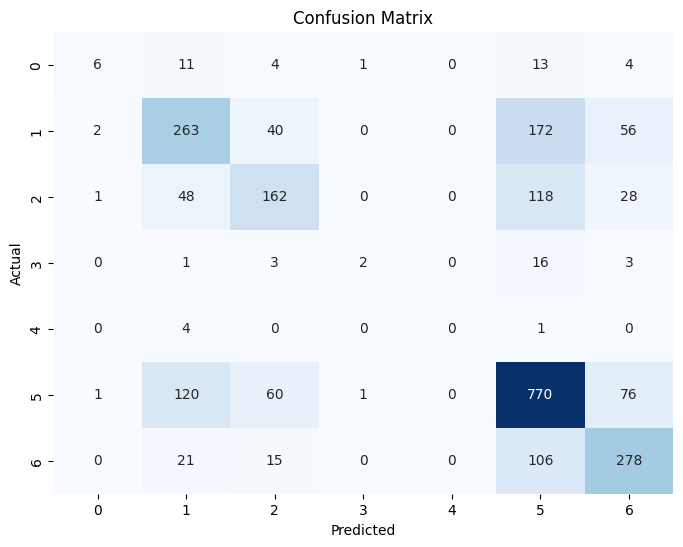

In [57]:
# Create a confusion matrix
cm = confusion_matrix(y_test, rfc_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=rfc.classes_, yticklabels=rfc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [58]:
params = {"max_depth": [32,44,50],
         "n_estimators": [15,18,26,32],
          "min_samples_leaf": [40,50,60],
         "criterion": ["gini", "entropy"]}

from sklearn import model_selection

gs_rf = model_selection.GridSearchCV(estimator=rfc,
                                 param_grid=params,
                                 cv=5,
                                 scoring="accuracy")

gs_rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [32, 44, 50],
                         'min_samples_leaf': [40, 50, 60],
                         'n_estimators': [15, 18, 26, 32]},
             scoring='accuracy')

In [59]:
# Extract the best parameters
gs_rf.best_params_

{'criterion': 'gini',
 'max_depth': 44,
 'min_samples_leaf': 40,
 'n_estimators': 32}

In [60]:
# Accuracy score after grid search
gs_rf_accuracy_score = gs_rf.best_score_ 
gs_rf_accuracy_score

0.5887111648674689

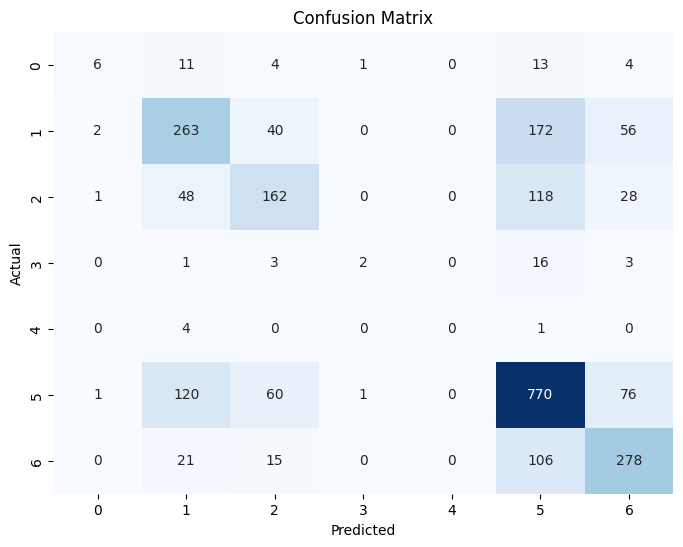

In [61]:
# Create a confusion matrix
cm = confusion_matrix(y_test, rfc_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=rfc.classes_, yticklabels=rfc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## Logistic Regression

In [62]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8021 entries, 0 to 8020
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       8021 non-null   int64  
 1   name                     7566 non-null   object 
 2   date                     8021 non-null   object 
 3   manner_of_death          8021 non-null   object 
 4   armed                    7810 non-null   object 
 5   age                      7517 non-null   float64
 6   gender                   7990 non-null   object 
 7   race                     6502 non-null   object 
 8   signs_of_mental_illness  8021 non-null   int32  
 9   threat_level             8021 non-null   object 
 10  flee                     7053 non-null   object 
 11  body_camera              8002 non-null   float64
 12  longitude                7180 non-null   float64
 13  latitude                 7180 non-null   float64
 14  is_geocoding_exact      

In [63]:
data3 = data2.dropna()
data3.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,1,attack,...,0.0,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,0,attack,...,0.0,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,0,other,...,0.0,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,1,attack,...,0.0,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,0,attack,...,0.0,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [64]:
dat = data2.copy()
dat["armed"].fillna(dat['armed'].value_counts().idxmax(), inplace = True)
dat['age'].fillna(dat['age'].median(skipna=True), inplace=True)
dat['gender'].fillna(dat['gender'].value_counts().idxmax(), inplace = True)
dat['flee'].fillna(dat['flee'].value_counts().idxmax(), inplace = True)


In [65]:
dat2 = dat.dropna()
dat2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4999 entries, 0 to 7996
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       4999 non-null   int64  
 1   name                     4999 non-null   object 
 2   date                     4999 non-null   object 
 3   manner_of_death          4999 non-null   object 
 4   armed                    4999 non-null   object 
 5   age                      4999 non-null   float64
 6   gender                   4999 non-null   object 
 7   race                     4999 non-null   object 
 8   signs_of_mental_illness  4999 non-null   int32  
 9   threat_level             4999 non-null   object 
 10  flee                     4999 non-null   object 
 11  body_camera              4999 non-null   float64
 12  longitude                4999 non-null   float64
 13  latitude                 4999 non-null   float64
 14  is_geocoding_exact       4999

In [66]:
# Transforming columns into dummy varaibles

dummies = pd.get_dummies(dat2[["armed", "gender", "city", "threat_level", "flee","signs_of_mental_illness","manner_of_death"]], drop_first=True)
dummies = pd.concat([dat2, dummies], axis=1)

dummies.drop(dat2[["armed", "gender", "name", "date", "city", "threat_level", "flee","signs_of_mental_illness","manner_of_death"]], axis=1, inplace=True)
dummies.dropna()
dummies.head()

,id,age,race,body_camera,longitude,latitude,is_geocoding_exact,share_white,share_black,share_native_american,...,"city_Yulee , FL","city_Yuma , AZ","city_Zanesville , OH","city_Zion , IL",threat_level_other,threat_level_undetermined,flee_Foot,flee_Not fleeing,flee_Other,manner_of_death_shot and Tasered
0,3,53.0,A,0.0,-123.122,47.247,True,78.9,0.8,3.7,...,False,False,False,False,False,False,False,True,False,False
1,4,47.0,W,0.0,-122.892,45.487,True,70.9,2.6,1,...,False,False,False,False,False,False,False,True,False,False
2,5,23.0,H,0.0,-97.281,37.695,True,71.9,11.5,1.2,...,False,False,False,False,True,False,False,True,False,True
3,8,32.0,W,0.0,-122.422,37.763,True,48.5,6.1,0.5,...,False,False,False,False,False,False,False,True,False,False
4,9,39.0,H,0.0,-104.692,40.384,True,76.5,0.9,1.2,...,False,False,False,False,False,False,False,True,False,False


In [67]:
X = dummies.drop("race", axis=1)
y = dummies["race"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

from sklearn.linear_model import LogisticRegression

logmodel = LogisticRegression()
logmodel.fit(X_train, y_train)

c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [68]:
predictions = logmodel.predict(X_test)
print (classification_report(y_test, predictions))

              precision    recall  f1-score   support

           A       0.00      0.00      0.00        31
           B       0.66      0.57      0.61       437
           H       0.58      0.55      0.56       289
           N       0.00      0.00      0.00        17
           O       0.00      0.00      0.00         1
           W       0.67      0.78      0.72       725

    accuracy                           0.65      1500
   macro avg       0.32      0.32      0.32      1500
weighted avg       0.63      0.65      0.63      1500



c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

In [69]:
# Accuracy score
log_accuracy_score = accuracy_score(y_test, predictions)
log_accuracy_score

0.6486666666666666

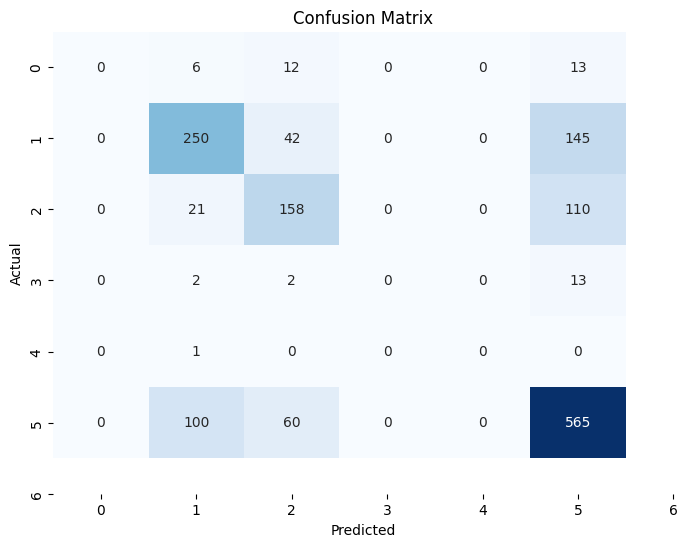

In [70]:
# Create a confusion matrix
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=rfc.classes_, yticklabels=rfc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
params = {"max_iter": [20,30,50],
         "C": [1.0, 2.0, 3.0]}

gs_logmodel = model_selection.GridSearchCV(estimator=logmodel,
                                 param_grid=params,
                                 cv=5,
                                 scoring="accuracy")

gs_logmodel.fit(X_train, y_train)

In [72]:
gs_logmodel.best_params_

{'C': 1.0, 'max_iter': 50}

In [73]:
# Accuracy score
gs_logmodel_accuracy_score = gs_logmodel.best_score_
gs_logmodel_accuracy_score

0.6207459636215

In [74]:
import folium
from geopy.geocoders import Nominatim

In [75]:
dat2.head()


,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,1,attack,...,0.0,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,0,attack,...,0.0,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,0,other,...,0.0,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,1,attack,...,0.0,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,0,attack,...,0.0,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [77]:
from sklearn.neighbors import KNeighborsClassifier

X = dummies.drop("race", axis=1)
y = dummies["race"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

knn = KNeighborsClassifier(n_neighbors=320) # k=1
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=320)

In [ ]:
knn_accuracy_score = accuracy_score(y_test, pred)
knn_accuracy_score

In [79]:
florida = pd.read_csv(r'D:/UMassD Files/MTH 522/Project 2\data-police-shootings-master/v1/fatal-police-shootings-data.csv')
florida.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [80]:
florida.drop(['name','date','id','manner_of_death','armed','age','gender','race','signs_of_mental_illness','threat_level','flee','body_camera','is_geocoding_exact'],axis=1,inplace = True)

In [82]:
florida1 = florida.loc[florida['state']=='FL']
florida1.head()

,city,state,longitude,latitude
52,Fort Lauderdale,FL,-80.212,26.150
83,Tallahassee,FL,-84.330,30.466
84,Orlando,FL,-81.306,28.500
96,Orange County,FL,-81.329,28.482
114,Miami Gardens,FL,-80.208,25.951


In [83]:
city_groups = florida1.groupby('city')

city_means = city_groups[['latitude','longitude']].transform('mean')

city_means

,latitude,longitude
52,26.145600,-80.163400
83,30.448429,-84.345143
84,28.513400,-81.352640
96,28.523500,-81.242500
114,25.948750,-80.223500
...,...,...
7952,26.701500,-80.073250
7955,30.377000,-86.353000
7975,30.321421,-81.673658
7990,27.778625,-82.677875


In [84]:
florida1['latitude'].fillna(city_means['latitude'],inplace = True)
florida1['longitude'].fillna(city_means['longitude'],inplace = True)

C:\Users\devch\AppData\Local\Temp\ipykernel_7812\1104950837.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  florida1['latitude'].fillna(city_means['latitude'],inplace = True)
C:\Users\devch\AppData\Local\Temp\ipykernel_7812\1104950837.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  florida1['longitude'].fillna(city_means['longitude'],inplace = True)


In [85]:
florida1.dropna()

,city,state,longitude,latitude
52,Fort Lauderdale,FL,-80.212,26.150
83,Tallahassee,FL,-84.330,30.466
84,Orlando,FL,-81.306,28.500
96,Orange County,FL,-81.329,28.482
114,Miami Gardens,FL,-80.208,25.951
...,...,...,...,...
7952,West Palm Beach,FL,-80.064,26.737
7955,Miramar Beach,FL,-86.353,30.377
7975,Jacksonville,FL,-81.687,30.318
7990,St. Petersburg,FL,-82.712,27.784


In [86]:
florida2 = florida1.drop(['city','state'],axis = 1, inplace = True)

C:\Users\devch\AppData\Local\Temp\ipykernel_7812\2934303389.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  florida2 = florida1.drop(['city','state'],axis = 1, inplace = True)


In [88]:
# Check for non-numeric entries in 'latitude' and 'longitude'
non_numeric_lat = pd.to_numeric(florida1['latitude'], errors='coerce').isnull()
non_numeric_lon = pd.to_numeric(florida1['longitude'], errors='coerce').isnull()

# Filter rows with non-numeric entries
rows_with_non_numeric = florida1[non_numeric_lat | non_numeric_lon]

# Print information about rows with non-numeric entries
print("Rows with non-numeric entries:")
print(rows_with_non_numeric)


Rows with non-numeric entries:
      longitude  latitude
3080        NaN       NaN
3792        NaN       NaN
4701        NaN       NaN
4968        NaN       NaN
5282        NaN       NaN
6180        NaN       NaN
6537        NaN       NaN
6856        NaN       NaN
7138        NaN       NaN
7527        NaN       NaN
7666        NaN       NaN
7678        NaN       NaN


In [89]:
# Drop rows with non-numeric entries
florida1 = florida1.drop(index=rows_with_non_numeric.index)

# Check for NaN values after dropping
print(florida1.isnull().sum())

longitude    0
latitude     0
dtype: int64


In [90]:
num_clusters = 3
coordinates = florida1[['latitude','longitude']].values

coordinates

array([[ 26.15      , -80.212     ],
       [ 30.466     , -84.33      ],
       [ 28.5       , -81.306     ],
       [ 28.482     , -81.329     ],
       [ 25.951     , -80.208     ],
       [ 27.99      , -80.645     ],
       [ 28.104     , -81.95      ],
       [ 28.887     , -81.254     ],
       [ 29.743     , -81.959     ],
       [ 28.351     , -80.749     ],
       [ 30.461     , -84.279     ],
       [ 30.379     , -81.68      ],
       [ 27.435     , -80.328     ],
       [ 28.102     , -82.49      ],
       [ 30.413     , -86.835     ],
       [ 25.844     , -80.212     ],
       [ 30.171     , -85.702     ],
       [ 28.567     , -81.812     ],
       [ 29.973     , -81.481     ],
       [ 30.213     , -81.739     ],
       [ 29.85      , -81.278     ],
       [ 27.82      , -82.659     ],
       [ 26.107     , -80.184     ],
       [ 27.059     , -82.25      ],
       [ 28.084     , -80.606     ],
       [ 26.276     , -80.105     ],
       [ 25.787     , -80.2       ],
 

In [91]:
print(florida1.isnull().sum())

longitude    0
latitude     0
dtype: int64


In [151]:
from sklearn.cluster import KMeans
import folium

# Specify the number of clusters
num_clusters = 5

# Extract latitude and longitude columns
coordinates = florida1[['latitude', 'longitude']].values

# Perform KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
florida1['cluster'] = kmeans.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[florida1['latitude'].mean(), florida1['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white']

# Plot each point with its cluster color on the map
for index, row in florida1.iterrows():
    location = [row['latitude'], row['longitude']]
    folium.CircleMarker(location, radius=2, color=colors[int(row['cluster'])], fill=True, fill_color=colors[int(row['cluster'])]).add_to(map_clusters)


# Save the map as an HTML file
map_clusters.save('cluster_map.html')

map_clusters

c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [94]:
texas = florida.loc[florida['state']=='TX']
texas.info()

<class 'pandas.core.frame.DataFrame'>
Index: 732 entries, 11 to 7996
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   city       732 non-null    object 
 1   state      732 non-null    object 
 2   longitude  667 non-null    float64
 3   latitude   667 non-null    float64
dtypes: float64(2), object(2)
memory usage: 28.6+ KB


In [95]:
city_groups = texas.groupby('city')

city_means = city_groups[['latitude','longitude']].transform('mean')

city_means

,latitude,longitude
11,28.955000,-95.369000
20,31.812526,-106.414000
25,28.915000,-98.544000
30,29.047000,-95.444500
37,32.387000,-96.085000
...,...,...
7968,30.503750,-97.662500
7984,30.503750,-97.662500
7985,27.743545,-97.412091
7987,33.170000,-96.649333


In [96]:
texas['latitude'].fillna(city_means['latitude'],inplace = True)
texas['longitude'].fillna(city_means['longitude'],inplace = True)

C:\Users\devch\AppData\Local\Temp\ipykernel_7812\3021315074.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  texas['latitude'].fillna(city_means['latitude'],inplace = True)
C:\Users\devch\AppData\Local\Temp\ipykernel_7812\3021315074.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  texas['longitude'].fillna(city_means['longitude'],inplace = True)


In [97]:
# Check for non-numeric entries in 'latitude' and 'longitude'
non_numeric_lat = pd.to_numeric(texas['latitude'], errors='coerce').isnull()
non_numeric_lon = pd.to_numeric(texas['longitude'], errors='coerce').isnull()

# Filter rows with non-numeric entries
rows_with_non_numeric = texas[non_numeric_lat | non_numeric_lon]

# Print information about rows with non-numeric entries
print("Rows with non-numeric entries:")
print(rows_with_non_numeric)

Rows with non-numeric entries:
                city state  longitude  latitude
2049       Panhandle    TX        NaN       NaN
2929         Crowell    TX        NaN       NaN
3188       Childress    TX        NaN       NaN
4118          Quanah    TX        NaN       NaN
4164  Cochran County    TX        NaN       NaN
4711      Sweetwater    TX        NaN       NaN
6016   Baylor County    TX        NaN       NaN
6184  Mount Pleasant    TX        NaN       NaN
6319        Alvarado    TX        NaN       NaN
6408     Forest Hill    TX        NaN       NaN
6591          Crosby    TX        NaN       NaN
6935           Simms    TX        NaN       NaN
7072  Wichita  Falls    TX        NaN       NaN
7087      Greenville    TX        NaN       NaN
7562        Beeville    TX        NaN       NaN
7673  Richland Hills    TX        NaN       NaN
7877        Rockdale    TX        NaN       NaN


In [98]:
# Drop rows with non-numeric entries
texas = texas.drop(index=rows_with_non_numeric.index)

# Check for NaN values after dropping
print(texas.isnull().sum())

city         0
state        0
longitude    0
latitude     0
dtype: int64


In [150]:
from sklearn.cluster import KMeans
import folium

# Specify the number of clusters
num_clusters = 5

# Extract latitude and longitude columns
coordinates = texas[['latitude', 'longitude']].values

# Perform KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
texas['cluster'] = kmeans.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[texas['latitude'].mean(), texas['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters and plot
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white']


for index, row in texas.iterrows():
    location = [row['latitude'], row['longitude']]
    folium.CircleMarker(location, radius=4, color=colors[int(row['cluster'])], fill=True, fill_color=colors[int(row['cluster'])]).add_to(map_clusters)

# Save the map as an HTML file
map_clusters.save('cluster_map.html')

map_clusters

c:\Users\devch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


## East Coast

In [100]:
florida.head()

,city,state,longitude,latitude
0,Shelton,WA,-123.122,47.247
1,Aloha,OR,-122.892,45.487
2,Wichita,KS,-97.281,37.695
3,San Francisco,CA,-122.422,37.763
4,Evans,CO,-104.692,40.384


In [101]:
# Define a list of east coast state codes
east_coast_states = ['CT', 'DE', 'FL', 'GA', 'ME', 'MD', 'MA', 'NH', 'NJ', 'NY', 'NC', 'SC', 'RI', 'VA', 'WV']

# Filter instances for the east coast states
eastcoast = florida[florida['state'].isin(east_coast_states)].copy()

In [102]:
eastcoast.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1887 entries, 28 to 8001
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   city       1887 non-null   object 
 1   state      1887 non-null   object 
 2   longitude  1699 non-null   float64
 3   latitude   1699 non-null   float64
dtypes: float64(2), object(2)
memory usage: 73.7+ KB


In [103]:
state_groups = eastcoast.groupby('state')

state_means = state_groups[['latitude','longitude']].transform('mean')

state_means

,latitude,longitude
28,37.569758,-78.473444
29,40.332791,-74.443302
44,42.331643,-71.308190
49,43.296700,-71.575650
52,28.265411,-81.799762
...,...,...
7980,35.581990,-79.873571
7990,28.265411,-81.799762
7992,37.569758,-78.473444
7993,39.160352,-76.705886


In [104]:
eastcoast['latitude'].fillna(state_means['latitude'],inplace = True)
eastcoast['longitude'].fillna(state_means['longitude'],inplace = True)

In [105]:
# Check for non-numeric entries in 'latitude' and 'longitude'
non_numeric_lati = pd.to_numeric(eastcoast['latitude'], errors='coerce').isnull()
non_numeric_long = pd.to_numeric(eastcoast['longitude'], errors='coerce').isnull()

# Filter rows with non-numeric entries
rows_with_non_numeric1 = eastcoast[non_numeric_lati | non_numeric_long]

# Print information about rows with non-numeric entries
print("Rows with non-numeric entries:")
print(rows_with_non_numeric1)

Rows with non-numeric entries:
Empty DataFrame
Columns: [city, state, longitude, latitude]
Index: []


In [106]:
eastcoast.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1887 entries, 28 to 8001
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   city       1887 non-null   object 
 1   state      1887 non-null   object 
 2   longitude  1887 non-null   float64
 3   latitude   1887 non-null   float64
dtypes: float64(2), object(2)
memory usage: 73.7+ KB


In [108]:
allstates = dat2.copy()
allstates.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,1,attack,...,0.0,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,0,attack,...,0.0,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,0,other,...,0.0,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,1,attack,...,0.0,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,0,attack,...,0.0,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [109]:
# Check for non-numeric entries in 'latitude' and 'longitude'
non_numeric_lati = pd.to_numeric(allstates['latitude'], errors='coerce').isnull()
non_numeric_long = pd.to_numeric(allstates['longitude'], errors='coerce').isnull()

# Filter rows with non-numeric entries
rows_with_non_numeric1 = allstates[non_numeric_lati | non_numeric_long]

# Print information about rows with non-numeric entries
print("Rows with non-numeric entries:")
print(rows_with_non_numeric1)

Rows with non-numeric entries:
Empty DataFrame
Columns: [id, name, date, manner_of_death, armed, age, gender, race, signs_of_mental_illness, threat_level, flee, body_camera, longitude, latitude, is_geocoding_exact, city, share_white, share_black, share_native_american, share_asian, share_hispanic]
Index: []

[0 rows x 21 columns]


In [101]:
from sklearn.cluster import DBSCAN
import folium

# Extract latitude and longitude columns
coordinates = allstates[['latitude', 'longitude']].values

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)
allstates['cluster'] = dbscan.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[allstates['latitude'].mean(), allstates['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'cyan', 'pink', 'magenta']

# Plot each point with its cluster color on the map
for index, row in allstates.iterrows():
    location = [row['latitude'], row['longitude']]
    cluster_color = colors[row['cluster'] % len(colors)]  # Handle more clusters than colors
    folium.CircleMarker(location, radius=3, color=cluster_color, fill=True, fill_color=cluster_color).add_to(map_clusters)

# Save the map as an HTML file
map_clusters.save('cluster_map_dbscan.html')

map_clusters


In [152]:
from sklearn.cluster import DBSCAN
import folium

# Extract latitude and longitude columns
coordinates = texas[['latitude', 'longitude']].values

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)
texas['cluster'] = dbscan.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[texas['latitude'].mean(), texas['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple',  'cyan', 'pink', 'magenta']

# Plot clusters on the map
for index, row in texas.iterrows():
    location = [row['latitude'], row['longitude']]
    cluster_color = colors[row['cluster'] % len(colors)]  # Handle more clusters than colors
    folium.CircleMarker(location, radius=3, color=cluster_color, fill=True, fill_color=cluster_color).add_to(map_clusters)

# Save the map as an HTML file
map_clusters.save('cluster_map_dbscan.html')

map_clusters


In [155]:
from sklearn.cluster import DBSCAN
import folium

# Extract latitude and longitude columns
coordinates = eastcoast[['latitude', 'longitude']].values

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)
eastcoast['cluster'] = dbscan.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[eastcoast['latitude'].mean(), eastcoast['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple',  'cyan', 'pink', 'magenta']

# Plot each point with its cluster color on the map
for index, row in eastcoast.iterrows():
    location = [row['latitude'], row['longitude']]
    cluster_color = colors[row['cluster'] % len(colors)]  # Handle more clusters than colors
    folium.CircleMarker(location, radius=1, color=cluster_color, fill=True, fill_color=cluster_color).add_to(map_clusters)

# Save the map as an HTML file
map_clusters.save('cluster_map_dbscan.html')

map_clusters


In [113]:
dat2.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,1,attack,...,0.0,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,0,attack,...,0.0,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,0,other,...,0.0,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,1,attack,...,0.0,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,0,attack,...,0.0,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [114]:
allstatesnums = dat2.copy()
allstatesnums.head()

,id,name,date,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,...,body_camera,longitude,latitude,is_geocoding_exact,city,share_white,share_black,share_native_american,share_asian,share_hispanic
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,1,attack,...,0.0,-123.122,47.247,True,"Shelton , WA",78.9,0.8,3.7,1.1,19.2
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,0,attack,...,0.0,-122.892,45.487,True,"Aloha , OR",70.9,2.6,1,8.9,21.1
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,0,other,...,0.0,-97.281,37.695,True,"Wichita , KS",71.9,11.5,1.2,4.8,15.3
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,1,attack,...,0.0,-122.422,37.763,True,"San Francisco , CA",48.5,6.1,0.5,33.3,15.1
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,0,attack,...,0.0,-104.692,40.384,True,"Evans , CO",76.5,0.9,1.2,0.9,43.1


In [115]:
allstatesnums.drop(['name','date','id','city','is_geocoding_exact'],axis = 1, inplace= True)
allstatesnums.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,share_white,share_black,share_native_american,share_asian,share_hispanic
0,shot,gun,53.0,M,A,1,attack,Not fleeing,0.0,-123.122,47.247,78.9,0.8,3.7,1.1,19.2
1,shot,gun,47.0,M,W,0,attack,Not fleeing,0.0,-122.892,45.487,70.9,2.6,1,8.9,21.1
2,shot and Tasered,unarmed,23.0,M,H,0,other,Not fleeing,0.0,-97.281,37.695,71.9,11.5,1.2,4.8,15.3
3,shot,toy weapon,32.0,M,W,1,attack,Not fleeing,0.0,-122.422,37.763,48.5,6.1,0.5,33.3,15.1
4,shot,nail gun,39.0,M,H,0,attack,Not fleeing,0.0,-104.692,40.384,76.5,0.9,1.2,0.9,43.1


In [116]:
from sklearn.preprocessing import OrdinalEncoder

# Select the columns for ordinal encoding
columns_to_encode = ['manner_of_death', 'armed', 'gender', 'race', 'signs_of_mental_illness', 'threat_level', 'flee']

# Create an instance of the OrdinalEncoder
encoder = OrdinalEncoder()

# Fit and transform the selected columns with ordinal encoding
allstatesnums[columns_to_encode] = encoder.fit_transform(allstatesnums[columns_to_encode])

# Display the updated DataFrame
print(allstatesnums.head())


   manner_of_death  armed   age  gender  race  signs_of_mental_illness  \
0              0.0   31.0  53.0     1.0   0.0                      1.0   
1              0.0   31.0  47.0     1.0   5.0                      0.0   
2              1.0   79.0  23.0     1.0   2.0                      0.0   
3              0.0   78.0  32.0     1.0   5.0                      1.0   
4              0.0   55.0  39.0     1.0   2.0                      0.0   

   threat_level  flee  body_camera  longitude  latitude share_white  \
0           0.0   2.0          0.0   -123.122    47.247        78.9   
1           0.0   2.0          0.0   -122.892    45.487        70.9   
2           1.0   2.0          0.0    -97.281    37.695        71.9   
3           0.0   2.0          0.0   -122.422    37.763        48.5   
4           0.0   2.0          0.0   -104.692    40.384        76.5   

  share_black share_native_american share_asian share_hispanic  
0         0.8                   3.7         1.1           19.2 

In [117]:
allstatesnums.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,share_white,share_black,share_native_american,share_asian,share_hispanic
0,0.0,31.0,53.0,1.0,0.0,1.0,0.0,2.0,0.0,-123.122,47.247,78.9,0.8,3.7,1.1,19.2
1,0.0,31.0,47.0,1.0,5.0,0.0,0.0,2.0,0.0,-122.892,45.487,70.9,2.6,1,8.9,21.1
2,1.0,79.0,23.0,1.0,2.0,0.0,1.0,2.0,0.0,-97.281,37.695,71.9,11.5,1.2,4.8,15.3
3,0.0,78.0,32.0,1.0,5.0,1.0,0.0,2.0,0.0,-122.422,37.763,48.5,6.1,0.5,33.3,15.1
4,0.0,55.0,39.0,1.0,2.0,0.0,0.0,2.0,0.0,-104.692,40.384,76.5,0.9,1.2,0.9,43.1


In [158]:
from sklearn.cluster import DBSCAN
import folium

# Extract latitude and longitude columns
coordinates = allstatesnums[['latitude', 'longitude']].values

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)
allstatesnums['cluster'] = dbscan.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[allstatesnums['latitude'].mean(), allstatesnums['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'cyan', 'pink', 'magenta']

# Plot each point with its cluster color on the map
for index, row in allstatesnums.iterrows():
    location = [row['latitude'], row['longitude']]
    cluster_color = colors[row['cluster'] % len(colors)]  # Handle more clusters than colors
    folium.CircleMarker(location, radius=1, color=cluster_color, fill=True, fill_color=cluster_color).add_to(map_clusters)

# Save the map as an HTML file
map_clusters.save('cluster_map_dbscan.html')

map_clusters


In [120]:
allstatesnums.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,share_white,share_black,share_native_american,share_asian,share_hispanic,cluster
0,0.0,31.0,53.0,1.0,0.0,1.0,0.0,2.0,0.0,-123.122,47.247,78.9,0.8,3.7,1.1,19.2,-1
1,0.0,31.0,47.0,1.0,5.0,0.0,0.0,2.0,0.0,-122.892,45.487,70.9,2.6,1,8.9,21.1,-1
2,1.0,79.0,23.0,1.0,2.0,0.0,1.0,2.0,0.0,-97.281,37.695,71.9,11.5,1.2,4.8,15.3,-1
3,0.0,78.0,32.0,1.0,5.0,1.0,0.0,2.0,0.0,-122.422,37.763,48.5,6.1,0.5,33.3,15.1,-1
4,0.0,55.0,39.0,1.0,2.0,0.0,0.0,2.0,0.0,-104.692,40.384,76.5,0.9,1.2,0.9,43.1,-1


In [121]:
allstates3 = pd.read_csv(r'D:/UMassD Files/MTH 522/Project 2\data-police-shootings-master/v1/fatal-police-shootings-data.csv')
allstates3.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [122]:
allstates3.drop(['name','date','id','is_geocoding_exact'],axis=1,inplace=True)

In [123]:
allstatesvals = allstates3.copy()

In [124]:
# Select the columns for ordinal encoding
columns_to_encode = ['manner_of_death', 'armed', 'gender', 'race', 'signs_of_mental_illness', 'threat_level', 'flee', 'body_camera']

# Create an instance of the OrdinalEncoder
encoder = OrdinalEncoder()

# Fit and transform the selected columns with ordinal encoding
allstatesvals[columns_to_encode] = encoder.fit_transform(allstatesvals[columns_to_encode])

# Display the updated DataFrame
print(allstatesvals.head())

   manner_of_death  armed   age  gender  race           city state  \
0              0.0   40.0  53.0     1.0   0.0        Shelton    WA   
1              0.0   40.0  47.0     1.0   5.0          Aloha    OR   
2              1.0   97.0  23.0     1.0   2.0        Wichita    KS   
3              0.0   96.0  32.0     1.0   5.0  San Francisco    CA   
4              0.0   71.0  39.0     1.0   2.0          Evans    CO   

   signs_of_mental_illness  threat_level  flee  body_camera  longitude  \
0                      1.0           0.0   2.0          0.0   -123.122   
1                      0.0           0.0   2.0          0.0   -122.892   
2                      0.0           1.0   2.0          0.0    -97.281   
3                      1.0           0.0   2.0          0.0   -122.422   
4                      0.0           0.0   2.0          0.0   -104.692   

   latitude  
0    47.247  
1    45.487  
2    37.695  
3    37.763  
4    40.384  


In [125]:
allstatesvals.head()

,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude
0,0.0,40.0,53.0,1.0,0.0,Shelton,WA,1.0,0.0,2.0,0.0,-123.122,47.247
1,0.0,40.0,47.0,1.0,5.0,Aloha,OR,0.0,0.0,2.0,0.0,-122.892,45.487
2,1.0,97.0,23.0,1.0,2.0,Wichita,KS,0.0,1.0,2.0,0.0,-97.281,37.695
3,0.0,96.0,32.0,1.0,5.0,San Francisco,CA,1.0,0.0,2.0,0.0,-122.422,37.763
4,0.0,71.0,39.0,1.0,2.0,Evans,CO,0.0,0.0,2.0,0.0,-104.692,40.384


In [126]:
state_groups = allstatesvals.groupby('state')

state_means = state_groups[['latitude','longitude']].transform('mean')

state_means


,latitude,longitude
0,47.188861,-121.513124
1,44.572198,-122.652570
2,38.332903,-96.580722
3,35.504016,-119.197600
4,39.507626,-105.097038
...,...,...
7997,33.466583,-111.830897
7998,35.504016,-119.197600
7999,35.504016,-119.197600
8000,38.332903,-96.580722


In [127]:
allstatesvals['latitude'].fillna(state_means['latitude'],inplace = True)
allstatesvals['longitude'].fillna(state_means['longitude'],inplace = True)


In [128]:
# Check for non-numeric entries in 'latitude' and 'longitude'
non_numeric_lati = pd.to_numeric(allstatesvals['latitude'], errors='coerce').isnull()
non_numeric_long = pd.to_numeric(allstatesvals['longitude'], errors='coerce').isnull()

# Filter rows with non-numeric entries
rows_with_non_numeric1 = allstatesvals[non_numeric_lati | non_numeric_long]

# Print information about rows with non-numeric entries
print("Rows with non-numeric entries:")
print(rows_with_non_numeric1)

Rows with non-numeric entries:
Empty DataFrame
Columns: [manner_of_death, armed, age, gender, race, city, state, signs_of_mental_illness, threat_level, flee, body_camera, longitude, latitude]
Index: []


In [130]:
allstatesvals.head()

,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,cluster
0,0.0,40.0,53.0,1.0,0.0,Shelton,WA,1.0,0.0,2.0,0.0,-123.122,47.247,0
1,0.0,40.0,47.0,1.0,5.0,Aloha,OR,0.0,0.0,2.0,0.0,-122.892,45.487,1
2,1.0,97.0,23.0,1.0,2.0,Wichita,KS,0.0,1.0,2.0,0.0,-97.281,37.695,2
3,0.0,96.0,32.0,1.0,5.0,San Francisco,CA,1.0,0.0,2.0,0.0,-122.422,37.763,3
4,0.0,71.0,39.0,1.0,2.0,Evans,CO,0.0,0.0,2.0,0.0,-104.692,40.384,4


In [131]:
floridanew = allstatesvals.loc[allstatesvals['state']== "FL"]
floridanew.head()

,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,cluster
52,0.0,NaN,29.0,1.0,1.0,Fort Lauderdale,FL,0.0,1.0,2.0,0.0,-80.212,26.150,20
83,0.0,97.0,28.0,1.0,1.0,Tallahassee,FL,0.0,0.0,2.0,0.0,-84.330,30.466,10
84,0.0,40.0,37.0,1.0,2.0,Orlando,FL,0.0,0.0,2.0,0.0,-81.306,28.500,20
96,0.0,40.0,46.0,1.0,5.0,Orange County,FL,0.0,0.0,2.0,0.0,-81.329,28.482,20
114,1.0,97.0,25.0,1.0,1.0,Miami Gardens,FL,1.0,1.0,2.0,0.0,-80.208,25.951,20


In [132]:
floridanew2 = floridanew.copy()

In [134]:
Calinew = allstatesvals.loc[allstatesvals['state']== "CA"]
Calinew.head()

,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,cluster
3,0.0,96.0,32.0,1.0,5.0,San Francisco,CA,1.0,0.0,2.0,0.0,-122.422,37.763,3
10,1.0,55.0,25.0,1.0,5.0,Stockton,CA,0.0,0.0,2.0,0.0,-121.299,37.930,3
22,0.0,40.0,23.0,1.0,2.0,South Gate,CA,0.0,0.0,2.0,0.0,-118.183,33.951,3
35,0.0,55.0,36.0,1.0,2.0,Fairfield,CA,1.0,1.0,2.0,0.0,-121.997,38.266,3
38,1.0,55.0,48.0,1.0,4.0,Fremont,CA,0.0,1.0,2.0,0.0,-122.060,37.588,3


In [135]:
# Extract latitude and longitude columns
coordinates = Calinew[['latitude', 'longitude']].values

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)
Calinew['cluster'] = dbscan.fit_predict(coordinates)

# Create a Folium map centered around the mean coordinates
map_clusters = folium.Map(location=[Calinew['latitude'].mean(), Calinew['longitude'].mean()], zoom_start=4)

# Assign different colors to clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
          'lightred', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'cyan', 'pink', 'magenta']

# Plot each point with its cluster color on the map
for index, row in Calinew.iterrows():
    location = [row['latitude'], row['longitude']]
    cluster_color = colors[row['cluster'] % len(colors)]  # Handle more clusters than colors
    folium.CircleMarker(location, radius=3, color=cluster_color, fill=True, fill_color=cluster_color).add_to(map_clusters)

# Save the map as an HTML file
map_clusters.save('cluster_map_dbscan.html')

map_clusters


C:\Users\devch\AppData\Local\Temp\ipykernel_7812\1825366579.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Calinew['cluster'] = dbscan.fit_predict(coordinates)


In [139]:
allstatesvals2 = allstatesvals.drop(['city','state'],axis=1,inplace=False)

In [140]:
allstatesvals2.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,cluster
0,0.0,40.0,53.0,1.0,0.0,1.0,0.0,2.0,0.0,-123.122,47.247,0
1,0.0,40.0,47.0,1.0,5.0,0.0,0.0,2.0,0.0,-122.892,45.487,1
2,1.0,97.0,23.0,1.0,2.0,0.0,1.0,2.0,0.0,-97.281,37.695,2
3,0.0,96.0,32.0,1.0,5.0,1.0,0.0,2.0,0.0,-122.422,37.763,3
4,0.0,71.0,39.0,1.0,2.0,0.0,0.0,2.0,0.0,-104.692,40.384,4


In [141]:
allstatesvals3 = allstatesvals2.copy()

In [142]:
allstatesvals2["armed"].fillna(allstatesvals2['armed'].value_counts().idxmax(), inplace = True)
allstatesvals2['age'].fillna(allstatesvals2['age'].median(skipna=True), inplace=True)
allstatesvals2['gender'].fillna(allstatesvals2['gender'].value_counts().idxmax(), inplace = True)
allstatesvals2['flee'].fillna(allstatesvals2['flee'].value_counts().idxmax(), inplace = True)

In [143]:
allstatesvals2.head()

,manner_of_death,armed,age,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,cluster
0,0.0,40.0,53.0,1.0,0.0,1.0,0.0,2.0,0.0,-123.122,47.247,0
1,0.0,40.0,47.0,1.0,5.0,0.0,0.0,2.0,0.0,-122.892,45.487,1
2,1.0,97.0,23.0,1.0,2.0,0.0,1.0,2.0,0.0,-97.281,37.695,2
3,0.0,96.0,32.0,1.0,5.0,1.0,0.0,2.0,0.0,-122.422,37.763,3
4,0.0,71.0,39.0,1.0,2.0,0.0,0.0,2.0,0.0,-104.692,40.384,4


In [144]:
# Check for non-numeric entries in 'latitude' and 'longitude'
non_numeric_lat = pd.to_numeric(allstatesvals2['latitude'], errors='coerce').isnull()
non_numeric_lon = pd.to_numeric(allstatesvals2['longitude'], errors='coerce').isnull()

# Filter rows with non-numeric entries
rows_with_non_numeric = allstatesvals2[non_numeric_lat | non_numeric_lon]

# Print information about rows with non-numeric entries
print("Rows with non-numeric entries:")
print(rows_with_non_numeric)


Rows with non-numeric entries:
Empty DataFrame
Columns: [manner_of_death, armed, age, gender, race, signs_of_mental_illness, threat_level, flee, body_camera, longitude, latitude, cluster]
Index: []


In [145]:
# Drop rows with non-numeric entries
allstatesvals2 = allstatesvals2.drop(index=rows_with_non_numeric.index)

# Check for NaN values after dropping
print(allstatesvals2.isnull().sum())

manner_of_death               0
armed                         0
age                           0
gender                        0
race                       1517
signs_of_mental_illness       0
threat_level                  0
flee                          0
body_camera                   0
longitude                     0
latitude                      0
cluster                       0
dtype: int64


In [146]:
allstatesvals4 = allstatesvals2.drop("race",axis = 1)

In [147]:
allstatesvals4.head()

,manner_of_death,armed,age,gender,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,cluster
0,0.0,40.0,53.0,1.0,1.0,0.0,2.0,0.0,-123.122,47.247,0
1,0.0,40.0,47.0,1.0,0.0,0.0,2.0,0.0,-122.892,45.487,1
2,1.0,97.0,23.0,1.0,0.0,1.0,2.0,0.0,-97.281,37.695,2
3,0.0,96.0,32.0,1.0,1.0,0.0,2.0,0.0,-122.422,37.763,3
4,0.0,71.0,39.0,1.0,0.0,0.0,2.0,0.0,-104.692,40.384,4
